In [16]:
import lightgbm as lgb
import shap
import pandas as pd
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt

Let's take a look at the explainability of our model!



In [5]:
completed_data = pd.read_csv("../data/TRAIN_911_DEMO_MERGED_ENCODED.CSV")


In [6]:
X = completed_data.drop(columns=["Description"])
y = completed_data["Description"]


In [7]:
X = X.drop(columns=["Post","District","Longitude", "Latitude", "Year", "Season_autumn", "Season_spring", "Season_winter", "Season_summer"])

In [9]:
X_train, X_valid, y_train, y_valid = train_test_split(X,y,test_size=0.2,random_state=42069)

In [11]:
MODEL = lgb.LGBMClassifier(boosting_type="goss",n_jobs=-1, silent=True,
                    objective = "multiclass",random_state=42069, class_weight="balanced", max_depth=30,
                    num_class=15, min_child_samples=19, min_child_weight=0.00020106166502972648,
                    n_estimators=79, num_leaves=17, reg_alpha=1.998033356098756)

In [12]:
MODEL.fit(X_train,y_train,eval_metric="auc_mu", eval_set=[(X_valid, y_valid)], early_stopping_rounds=15,
                    verbose=False)

LGBMClassifier(boosting_type='goss', class_weight='balanced', max_depth=30,
               min_child_samples=19, min_child_weight=0.00020106166502972648,
               n_estimators=79, num_class=15, num_leaves=17,
               objective='multiclass', random_state=42069,
               reg_alpha=1.998033356098756)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

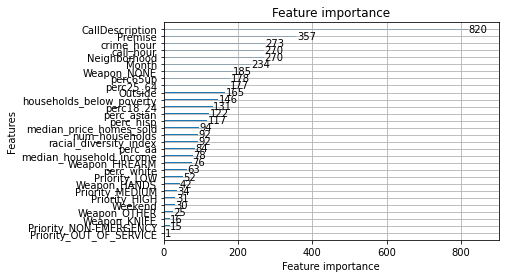

In [13]:
lgb.plot_importance(MODEL)

In [14]:
explainer = shap.TreeExplainer(MODEL)


In [24]:
shap_values_purchase = explainer.shap_values(X)



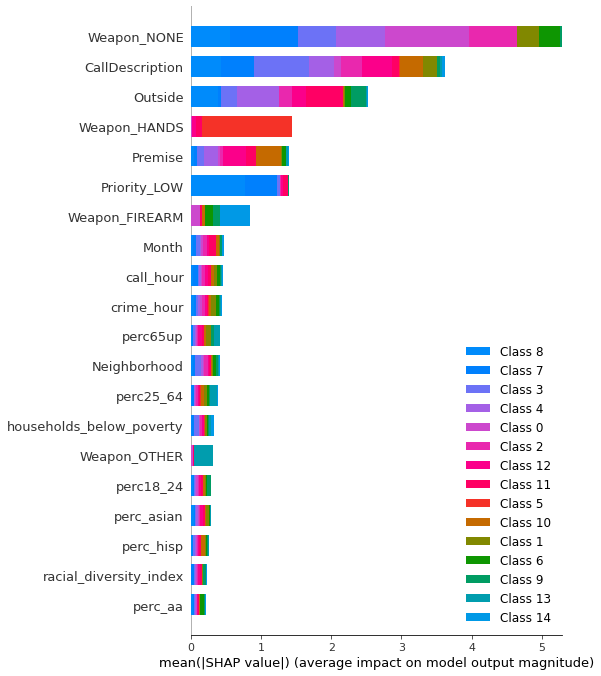

In [25]:
shap.summary_plot(shap_values_purchase,X,show=False)
plt.tight_layout()
plt.savefig("../images/SHAP_values_911.png",dpi=400)


In [22]:
shap.initjs()
shap.force_plot(explainer.expected_value[1],shap_values_purchase[1],X_train)


shap.plots.force is slow for many thousands of rows, try subsampling your data.


I'm going to have to load this outside of pycharm. I can't save this figure and I can't take a good screenshot as the preview pane is stuck on dark theme. Nice bug for jetbrains to fix.

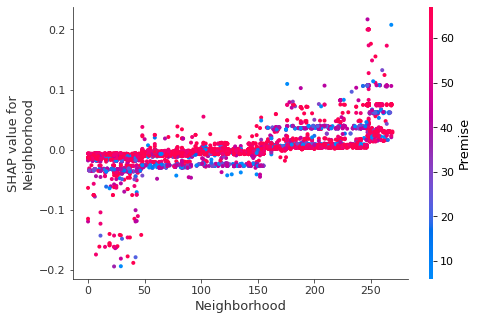

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


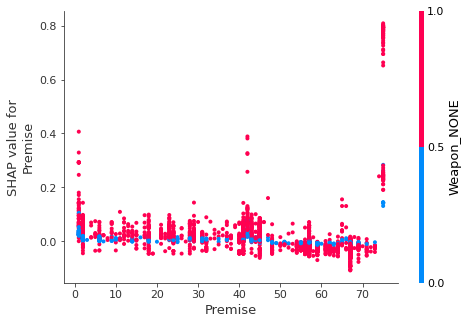

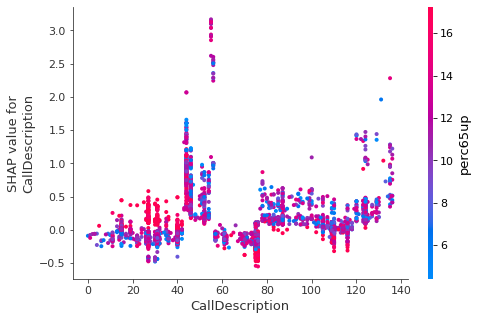

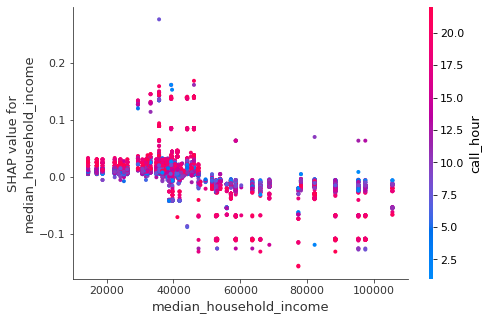

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


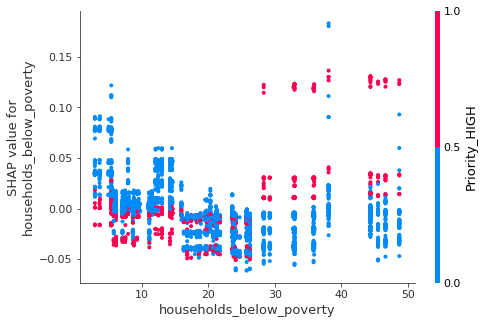

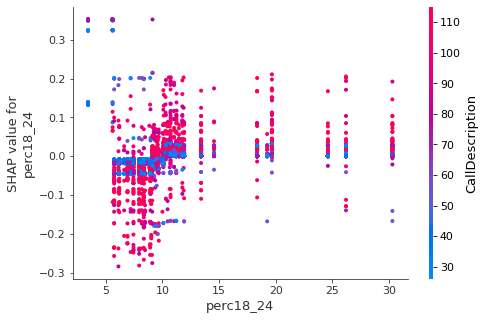

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


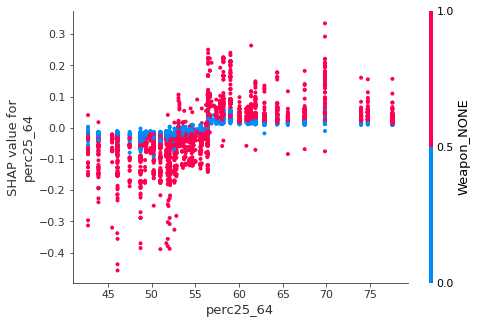

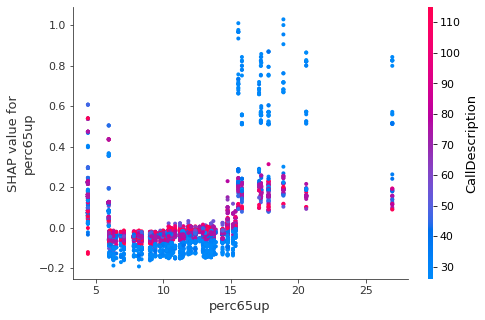

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


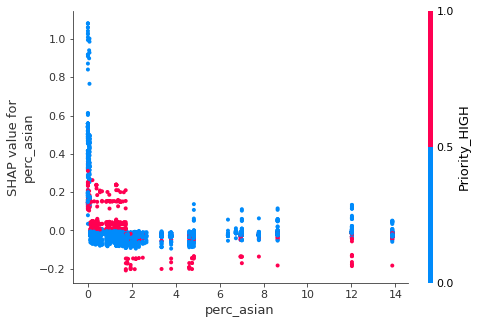

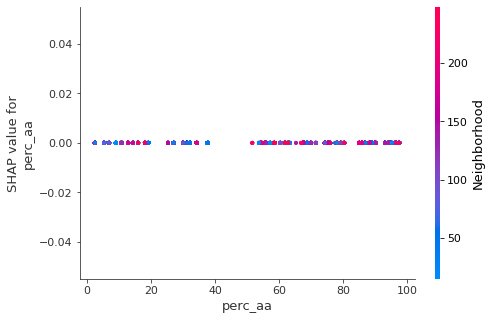

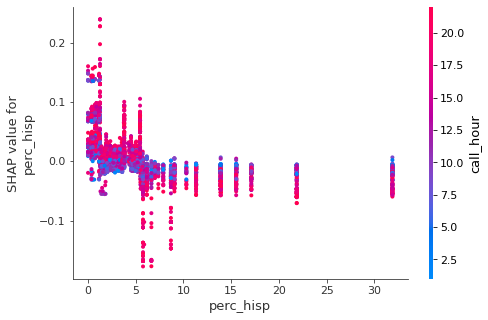

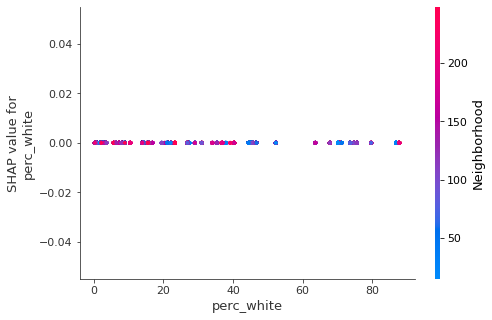

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


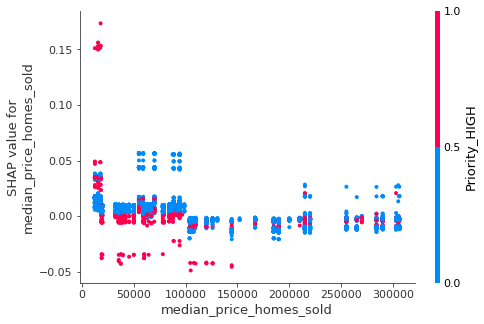

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


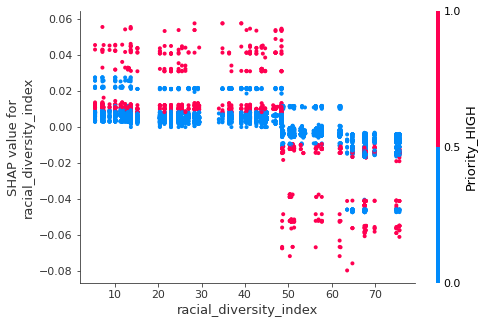

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


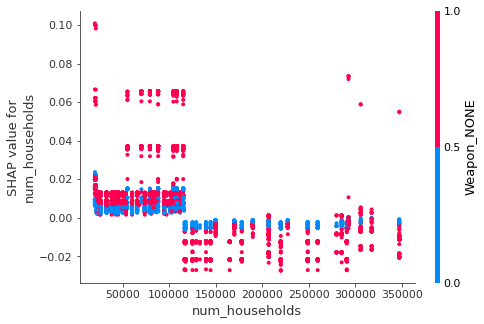

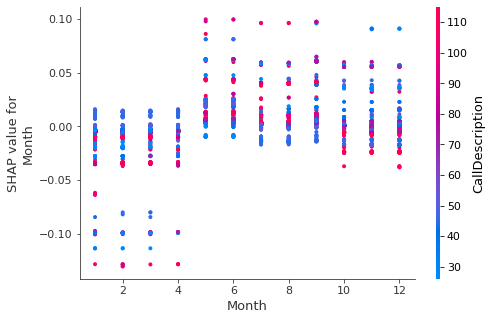

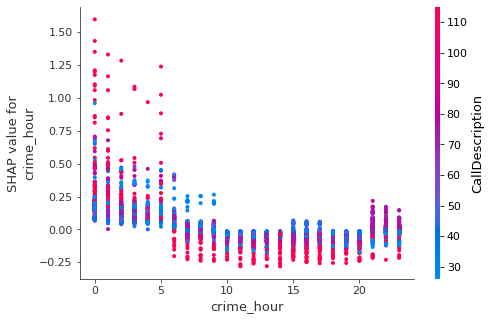

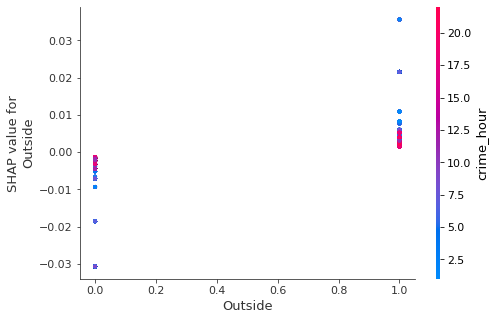

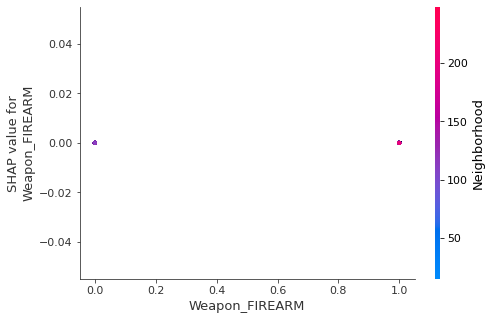

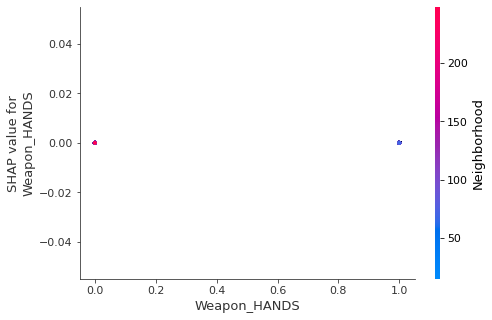

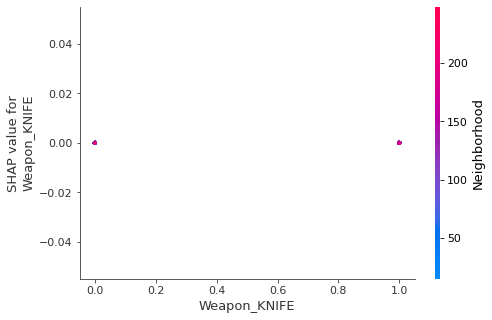

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


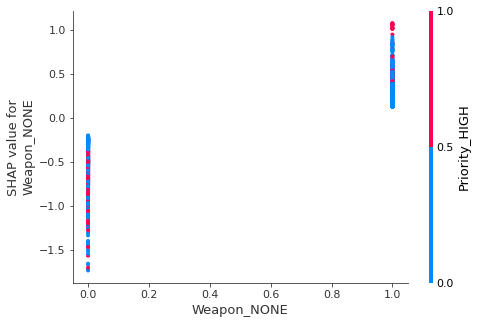

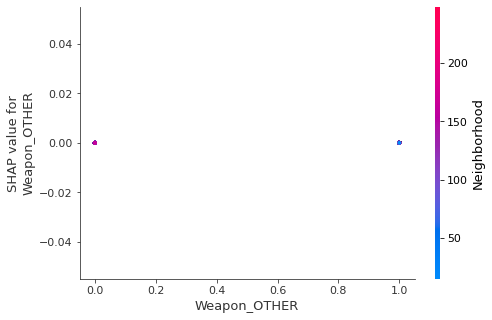

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


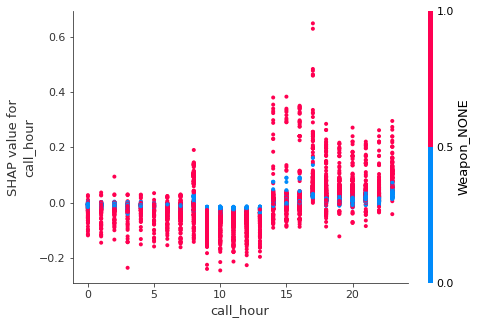

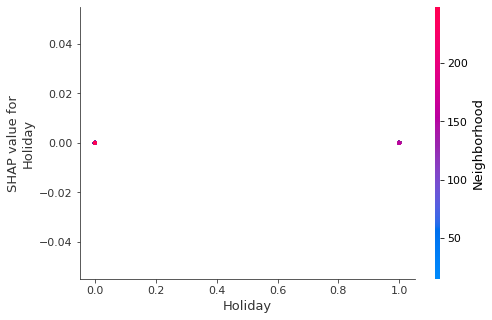

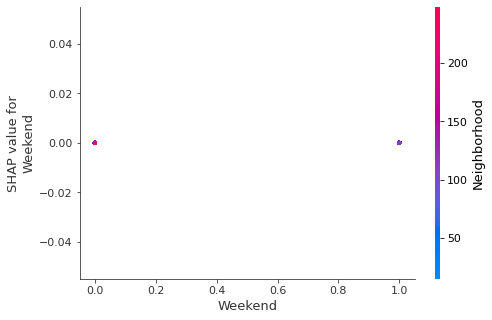

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


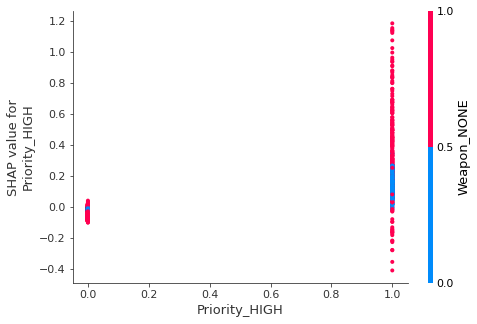

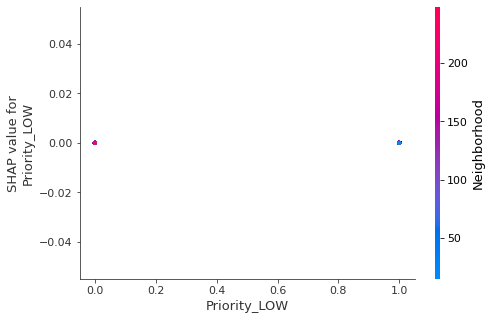

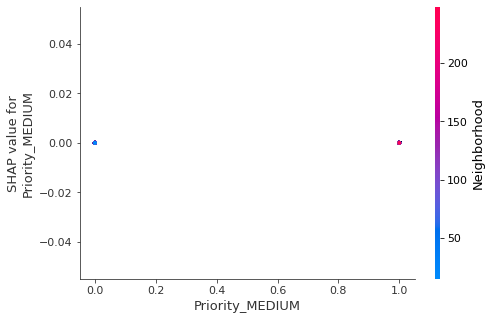

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


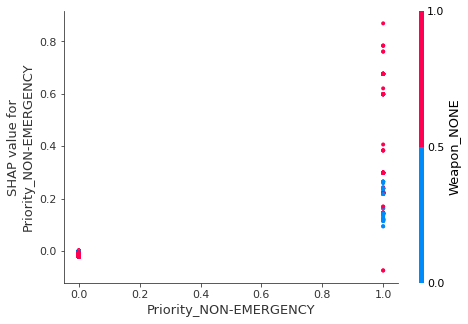

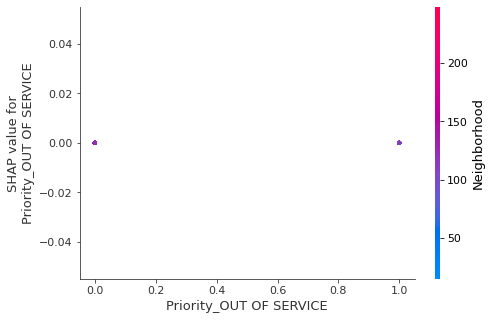

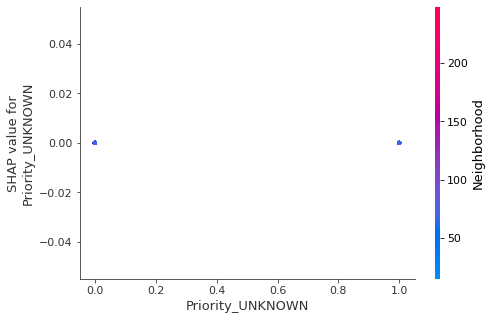

In [26]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values_purchase[1], X)
